# Data Gathering

In [1]:
# Importing Packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Preprocessing Libraries
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.impute import KNNImputer

# Model Libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge, Lasso



warnings.filterwarnings('ignore')

In [2]:
# Reading DataSet
df = pd.read_csv('./data/train.csv')

# Data Quality Assessment

In [3]:
pd.set_option('display.max_columns', None)
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
df.shape

(1460, 81)

In [6]:
# Splitting columns into Numerical and categorical columns
num_cols = [col for col in df.columns if df[col].dtype != 'O']
cat_cols = [col for col in df.columns if col not in num_cols]
print(f'Numerical columns: {num_cols}')
print(f'Categorical columns: {cat_cols}')

Numerical columns: ['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
Categorical columns: ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'Fireplace

In [7]:
df[num_cols].isnull().sum()/df.shape[0]*100

Id                0.000000
MSSubClass        0.000000
LotFrontage      17.739726
LotArea           0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
MasVnrArea        0.547945
BsmtFinSF1        0.000000
BsmtFinSF2        0.000000
BsmtUnfSF         0.000000
TotalBsmtSF       0.000000
1stFlrSF          0.000000
2ndFlrSF          0.000000
LowQualFinSF      0.000000
GrLivArea         0.000000
BsmtFullBath      0.000000
BsmtHalfBath      0.000000
FullBath          0.000000
HalfBath          0.000000
BedroomAbvGr      0.000000
KitchenAbvGr      0.000000
TotRmsAbvGrd      0.000000
Fireplaces        0.000000
GarageYrBlt       5.547945
GarageCars        0.000000
GarageArea        0.000000
WoodDeckSF        0.000000
OpenPorchSF       0.000000
EnclosedPorch     0.000000
3SsnPorch         0.000000
ScreenPorch       0.000000
PoolArea          0.000000
MiscVal           0.000000
MoSold            0.000000
YrSold            0.000000
S

In [8]:
df[cat_cols].isnull().sum()/df.shape[0]*100

MSZoning          0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType       59.726027
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinType2      2.602740
Heating           0.000000
HeatingQC         0.000000
CentralAir        0.000000
Electrical        0.068493
KitchenQual       0.000000
Functional        0.000000
FireplaceQu      47.260274
GarageType        5.547945
GarageFinish      5.547945
GarageQual        5.547945
GarageCond        5.547945
P

In [8]:
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")

Number of duplicate rows: 0


# Data Cleaning

In [9]:
columns_to_drop = ['MiscFeature', 'Alley', 'PoolQC','Fence']
df_cleaned = df.drop(columns=columns_to_drop)

print("Columns dropped:", columns_to_drop)
print("Shape of cleaned data:", df_cleaned.shape)

Columns dropped: ['MiscFeature', 'Alley', 'PoolQC', 'Fence']
Shape of cleaned data: (1460, 77)


In [11]:
null_values = df_cleaned.isnull().sum()
print("Missing values per column:\n", null_values[null_values > 0])

Missing values per column:
 LotFrontage     259
MasVnrType        8
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
FireplaceQu     690
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64


In [12]:
df_cleaned.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [13]:
df[cat_cols].describe().T

,count,unique,top,freq
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
Alley,91,2,Grvl,50
LotShape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225
Condition1,1460,9,Norm,1260


SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64


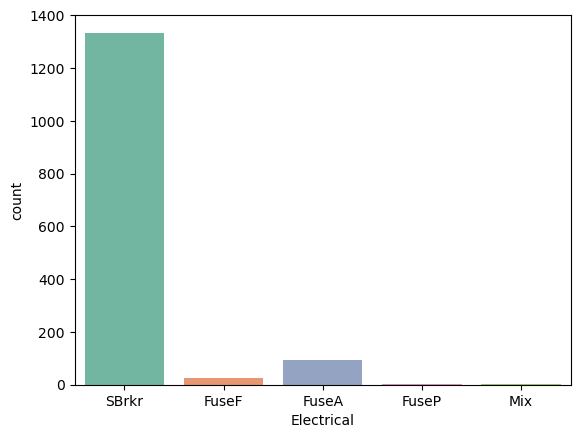

In [13]:
print(df['Electrical'].value_counts())
sns.countplot(x='Electrical', data=df, palette='Set2')
plt.show()

In [14]:
df_cleaned['Electrical'].fillna(df_cleaned['Electrical'].mode()[0], inplace=True)

In [15]:
df_cleaned["MasVnrArea"].fillna(df_cleaned["MasVnrArea"].median(), inplace=True)

In [16]:
print(df[['BsmtQual', 'BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']])

     BsmtQual BsmtCond BsmtExposure BsmtFinType1 BsmtFinType2
0          Gd       TA           No          GLQ          Unf
1          Gd       TA           Gd          ALQ          Unf
2          Gd       TA           Mn          GLQ          Unf
3          TA       Gd           No          ALQ          Unf
4          Gd       TA           Av          GLQ          Unf
...       ...      ...          ...          ...          ...
1455       Gd       TA           No          Unf          Unf
1456       Gd       TA           No          ALQ          Rec
1457       TA       Gd           No          GLQ          Unf
1458       TA       TA           Mn          GLQ          Rec
1459       TA       TA           No          BLQ          LwQ

[1460 rows x 5 columns]


TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64


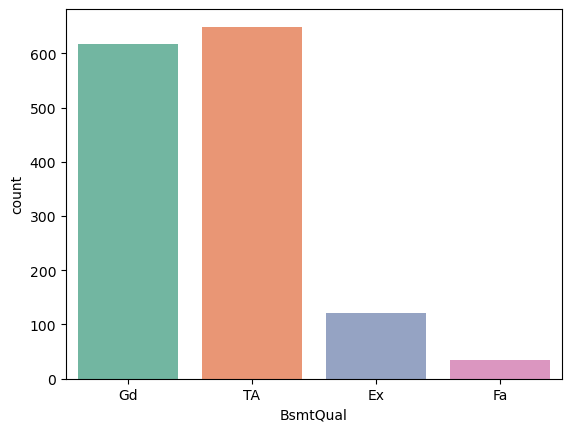

In [17]:
print(df['BsmtQual'].value_counts())
sns.countplot(x='BsmtQual', data=df, palette='Set2')
plt.show()

In [18]:
column_name = 'BsmtQual'
null_percentage = df[column_name].isnull().mean() * 100

print(f"Percentage of null values in '{column_name}': {null_percentage:.2f}%")

Percentage of null values in 'BsmtQual': 2.53%


In [19]:
df_cleaned['BsmtQual'].fillna(df_cleaned['BsmtQual'].mode()[0], inplace=True)

TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64


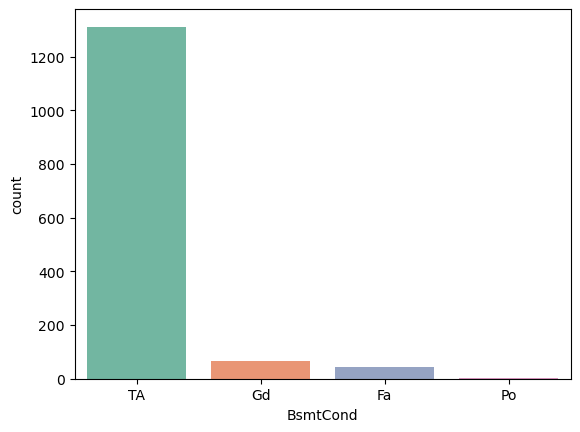

In [20]:
print(df['BsmtCond'].value_counts())
sns.countplot(x='BsmtCond', data=df, palette='Set2')
plt.show()

In [21]:
df_cleaned['BsmtCond'].fillna(df_cleaned['BsmtCond'].mode()[0], inplace=True)

No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64


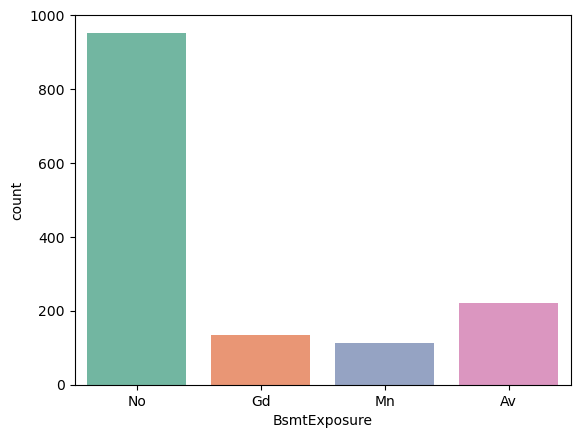

In [22]:
print(df['BsmtExposure'].value_counts())
sns.countplot(x='BsmtExposure', data=df, palette='Set2')
plt.show()

In [23]:
df_cleaned['BsmtExposure'].fillna(df_cleaned['BsmtExposure'].mode()[0], inplace=True)

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64


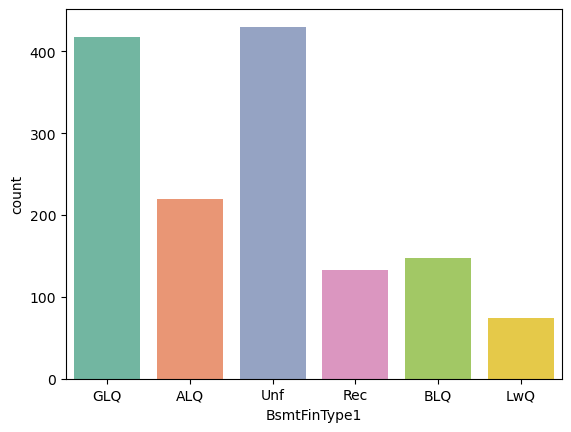

In [24]:
print(df['BsmtFinType1'].value_counts())
sns.countplot(x='BsmtFinType1', data=df, palette='Set2')
plt.show()

In [25]:
df_cleaned['BsmtFinType1'].fillna(df_cleaned['BsmtFinType1'].mode()[0], inplace=True)

Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64


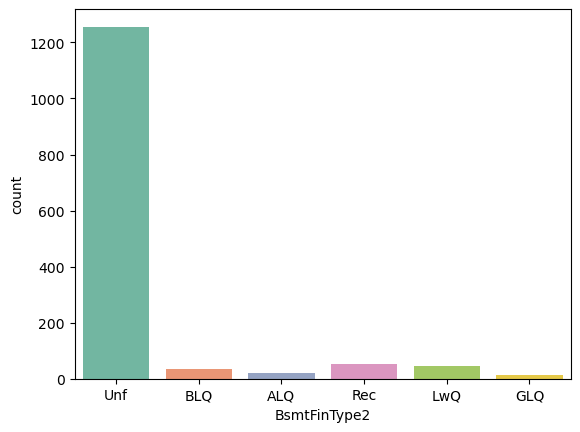

In [26]:
print(df['BsmtFinType2'].value_counts())
sns.countplot(x='BsmtFinType2', data=df, palette='Set2')
plt.show()

In [27]:
df_cleaned['BsmtFinType2'].fillna(df_cleaned['BsmtFinType2'].mode()[0], inplace=True)

In [28]:
print(df[['GarageType', 'GarageYrBlt','GarageFinish','GarageQual','GarageCond']])

     GarageType  GarageYrBlt GarageFinish GarageQual GarageCond
0        Attchd       2003.0          RFn         TA         TA
1        Attchd       1976.0          RFn         TA         TA
2        Attchd       2001.0          RFn         TA         TA
3        Detchd       1998.0          Unf         TA         TA
4        Attchd       2000.0          RFn         TA         TA
...         ...          ...          ...        ...        ...
1455     Attchd       1999.0          RFn         TA         TA
1456     Attchd       1978.0          Unf         TA         TA
1457     Attchd       1941.0          RFn         TA         TA
1458     Attchd       1950.0          Unf         TA         TA
1459     Attchd       1965.0          Fin         TA         TA

[1460 rows x 5 columns]


Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64


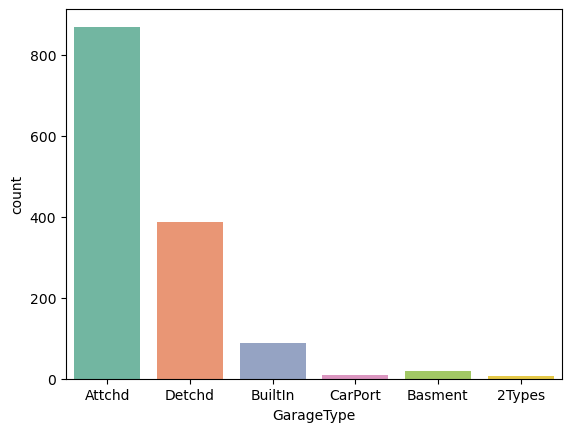

In [29]:
print(df['GarageType'].value_counts())
sns.countplot(x='GarageType', data=df, palette='Set2')
plt.show()

In [30]:
df_cleaned['GarageType'].fillna(df_cleaned['GarageType'].mode()[0], inplace=True)

Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64


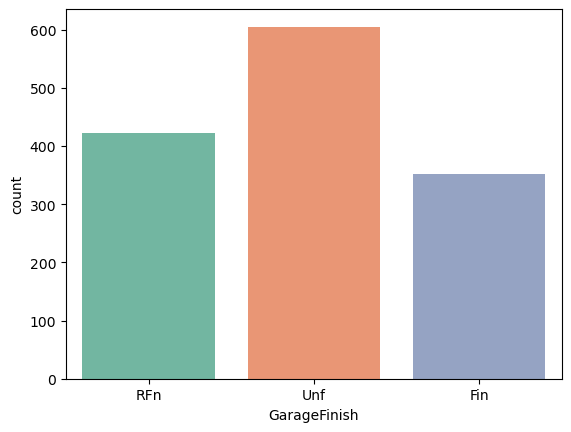

In [31]:
print(df['GarageFinish'].value_counts())
sns.countplot(x='GarageFinish', data=df, palette='Set2')
plt.show()

In [32]:
df_cleaned['GarageFinish'].fillna(df_cleaned['GarageFinish'].mode()[0], inplace=True)

TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64


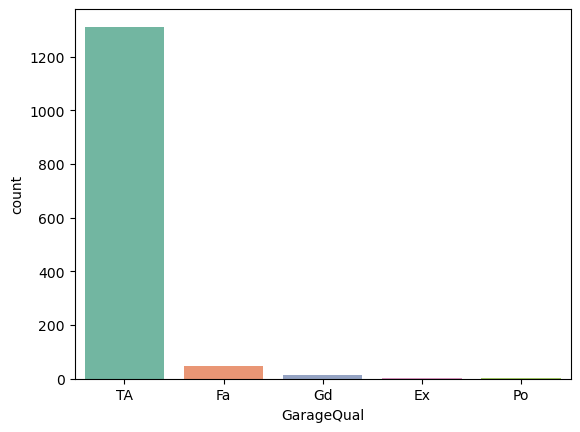

In [33]:
print(df['GarageQual'].value_counts())
sns.countplot(x='GarageQual', data=df, palette='Set2')
plt.show()

In [34]:
df_cleaned['GarageQual'].fillna(df_cleaned['GarageQual'].mode()[0], inplace=True)

TA    1326
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64


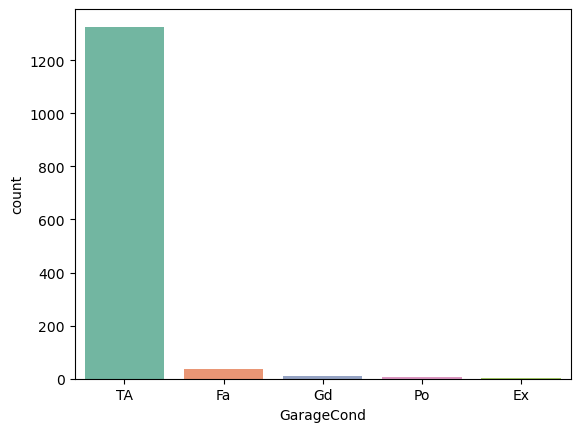

In [35]:
print(df['GarageCond'].value_counts())
sns.countplot(x='GarageCond', data=df, palette='Set2')
plt.show()

In [36]:
df_cleaned['GarageCond'].fillna(df_cleaned['GarageCond'].mode()[0], inplace=True)

In [37]:
df_cleaned["GarageYrBlt"].fillna(df_cleaned["GarageYrBlt"].median(), inplace=True)

In [38]:
print(df[['LotFrontage', 'FireplaceQu','MasVnrType']])

      LotFrontage FireplaceQu MasVnrType
0            65.0         NaN    BrkFace
1            80.0          TA       None
2            68.0          TA    BrkFace
3            60.0          Gd       None
4            84.0          TA    BrkFace
...           ...         ...        ...
1455         62.0          TA       None
1456         85.0          TA      Stone
1457         66.0          Gd       None
1458         68.0         NaN       None
1459         75.0         NaN       None

[1460 rows x 3 columns]


**Label Encoding**

In [39]:
dffff=df_cleaned.copy()

In [40]:
categorical_columns = dffff.select_dtypes(include=['object']).columns
label_encoder = LabelEncoder()
for col in categorical_columns:
    dffff[col] = label_encoder.fit_transform(dffff[col])
dffff.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,3,65.0,8450,1,3,3,0,4,0,5,2,2,0,5,7,5,2003,2003,1,1,12,13,1,196.0,2,4,2,2,3,3,2,706,5,0,150,856,1,0,1,4,856,854,0,1710,1,0,2,1,3,1,2,8,6,0,5,1,2003.0,1,2,548,4,4,2,0,61,0,0,0,0,0,2,2008,8,4,208500
1,2,20,3,80.0,9600,1,3,3,0,2,0,24,1,2,0,2,6,8,1976,1976,1,1,8,8,2,0.0,3,4,1,2,3,1,0,978,5,0,284,1262,1,0,1,4,1262,0,0,1262,0,1,2,0,3,1,3,6,6,1,4,1,1976.0,1,2,460,4,4,2,298,0,0,0,0,0,0,5,2007,8,4,181500
2,3,60,3,68.0,11250,1,0,3,0,4,0,5,2,2,0,5,7,5,2001,2002,1,1,12,13,1,162.0,2,4,2,2,3,2,2,486,5,0,434,920,1,0,1,4,920,866,0,1786,1,0,2,1,3,1,2,6,6,1,4,1,2001.0,1,2,608,4,4,2,0,42,0,0,0,0,0,9,2008,8,4,223500
3,4,70,3,60.0,9550,1,0,3,0,0,0,6,2,2,0,5,7,5,1915,1970,1,1,13,15,2,0.0,3,4,0,3,1,3,0,216,5,0,540,756,1,2,1,4,961,756,0,1717,1,0,1,0,3,1,2,7,6,1,2,5,1998.0,2,3,642,4,4,2,0,35,272,0,0,0,0,2,2006,8,0,140000
4,5,60,3,84.0,14260,1,0,3,0,2,0,15,2,2,0,5,8,5,2000,2000,1,1,12,13,1,350.0,2,4,2,2,3,0,2,655,5,0,490,1145,1,0,1,4,1145,1053,0,2198,1,0,2,1,4,1,2,9,6,1,4,1,2000.0,1,3,836,4,4,2,192,84,0,0,0,0,0,12,2008,8,4,250000


In [41]:
dffff.shape

(1460, 77)

In [42]:
imputer = KNNImputer(n_neighbors=5)
columns_to_impute = ['FireplaceQu','LotFrontage','MasVnrType']
dffff[columns_to_impute] = imputer.fit_transform(dffff[columns_to_impute])
print(dffff[columns_to_impute].isnull().sum())


FireplaceQu    0
LotFrontage    0
MasVnrType     0
dtype: int64


# Data Analysis

In [43]:
df_analysis = dffff.copy()

In [44]:
numerical_data = df_analysis.select_dtypes(include='number').columns.tolist()
categorical_data = df_analysis.select_dtypes(include='object').columns.tolist()

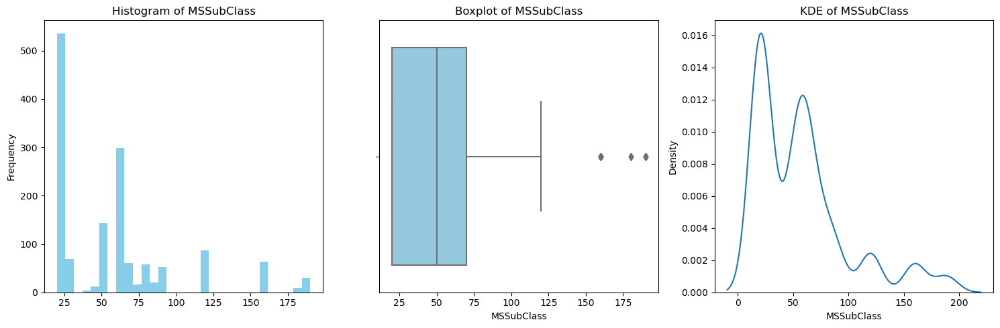

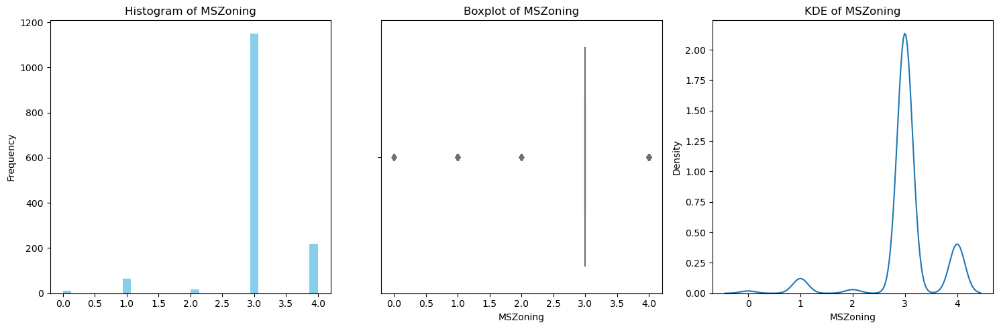

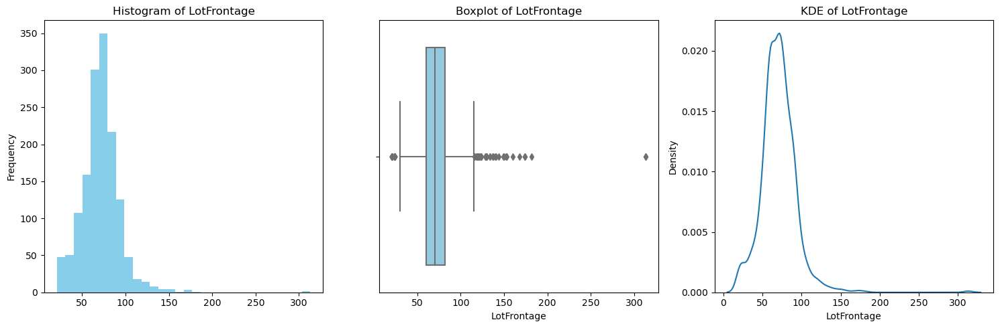

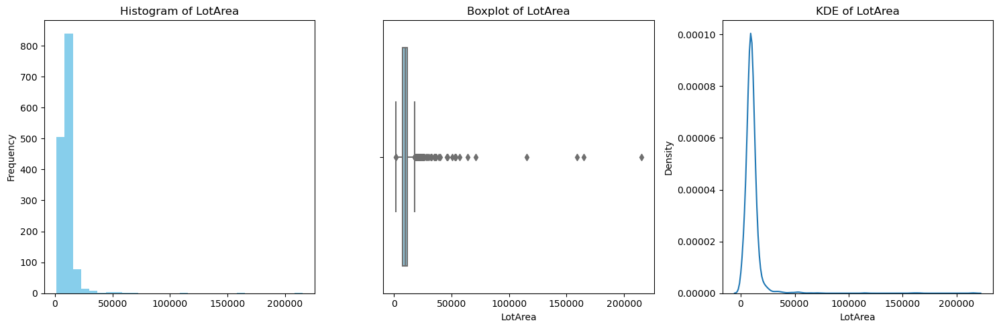

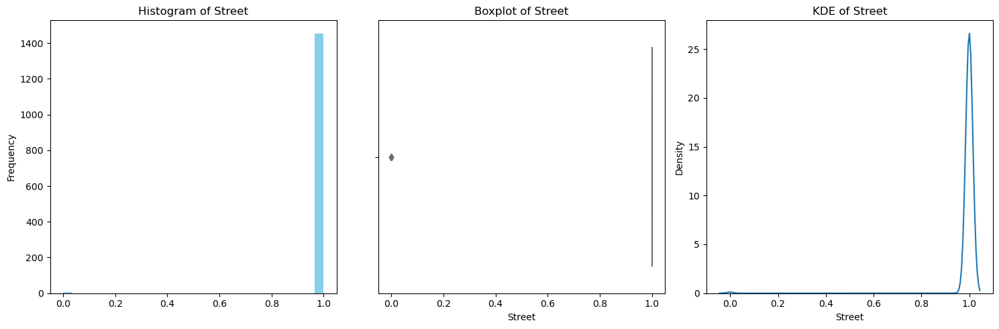

...

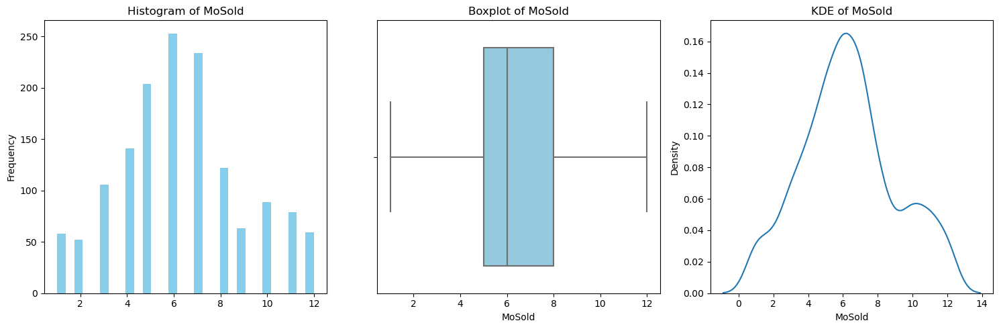

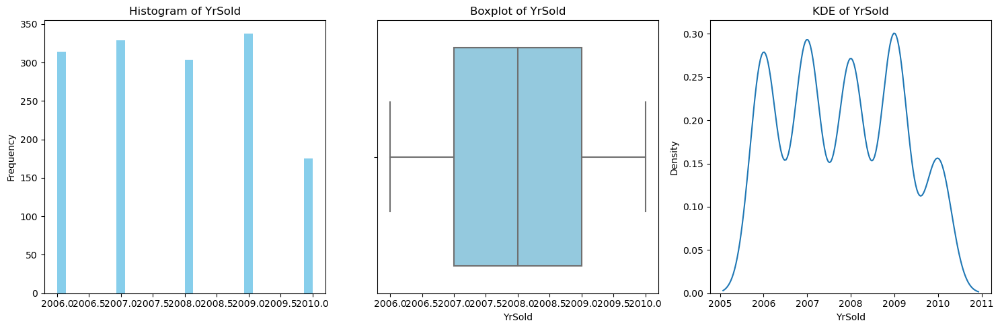

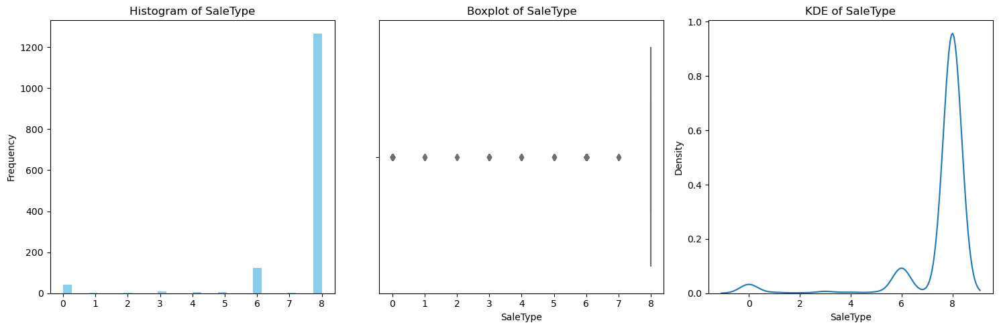

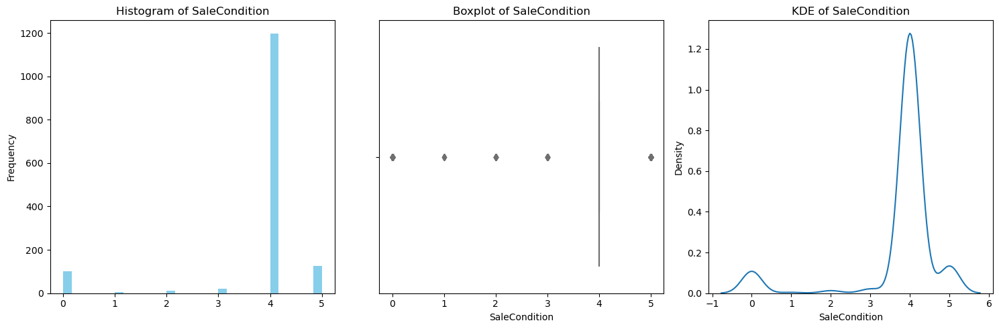

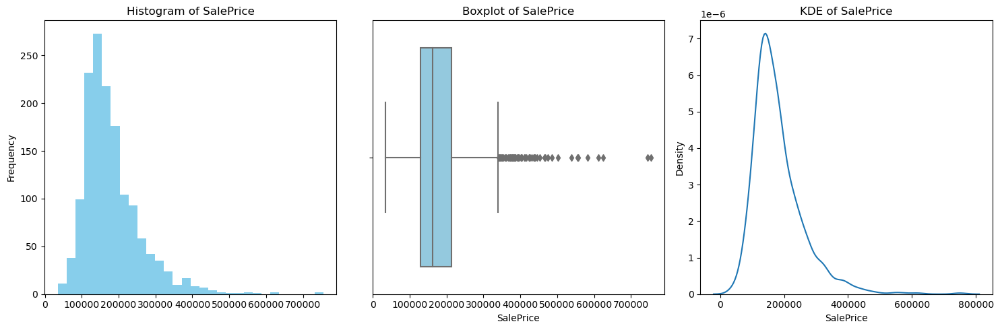

In [45]:
# Univariate Analysis on numerical columns
for col in numerical_data[1:]:
    plt.figure(figsize=(15, 5))

    # Histogram
    plt.subplot(1, 3, 1)
    df_analysis[col].plot.hist(bins=30, color='skyblue')
    plt.title(f'Histogram of {col}')

    # Boxplot
    plt.subplot(1, 3, 2)
    sns.boxplot(x=df_analysis[col],color='skyblue')
    plt.title(f'Boxplot of {col}')

    # KDE plot
    plt.subplot(1, 3, 3)
    sns.kdeplot(df_analysis[col])
    plt.title(f'KDE of {col}')

    plt.tight_layout()
    plt.show()

In [46]:
# For categorical columns
n_cols = 2
n_rows = (len(categorical_data) + 1) // n_cols

plt.figure(figsize=(15, 5 * n_rows))

for i, col in enumerate(categorical_data):
    plt.subplot(n_rows, n_cols, i + 1)
    value_counts = df_analysis[col].dropna().value_counts()
    sns.barplot(x=value_counts.index, y=value_counts.values, palette='tab10', legend=False)
    plt.title(f'Bar Chart of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<Figure size 1500x0 with 0 Axes>

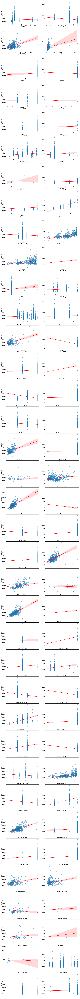

In [47]:
# Bivariate Analysis on numerical columns
cols_to_plot = numerical_data[1:len(numerical_data)-2]
n_cols = 2
n_rows = (len(cols_to_plot) + n_cols - 1) // n_cols

plt.figure(figsize=(15, 5 * n_rows))

for i, col in enumerate(cols_to_plot):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.regplot(data=df_analysis, x=df_analysis[col], y=df_analysis["SalePrice"], scatter_kws={'s':30,'alpha':0.5}, line_kws={'color':'red'})
    plt.title(f'{col} vs SalePrice')
    plt.xlabel(col)
    plt.ylabel("SalePrice")

plt.tight_layout()
plt.show()

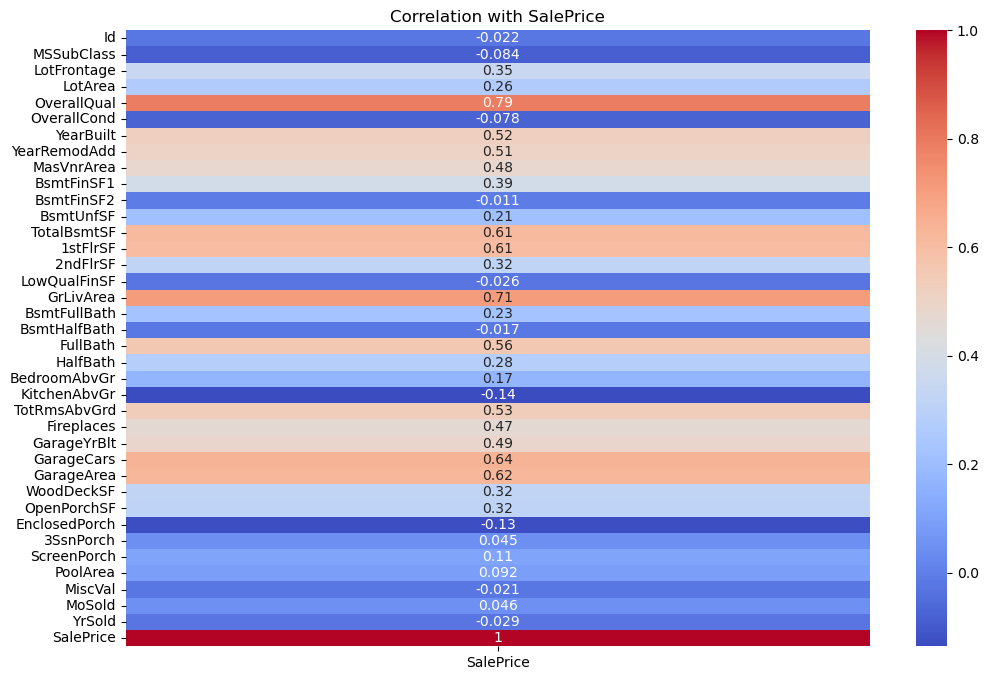

In [48]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True)[['SalePrice']], annot=True, cmap='coolwarm')
plt.title('Correlation with SalePrice')
plt.show()

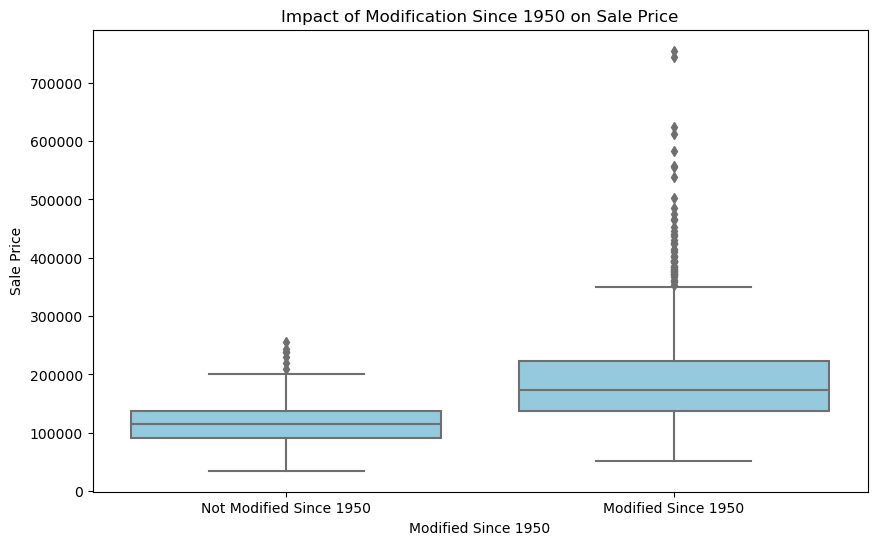

In [49]:
# Determining if homes that haven't been modified since 1950 have a lower sale price than homes that have
df_analysis['ModifiedSince1950'] = df_analysis['YearRemodAdd'] > 1950

plt.figure(figsize=(10, 6))
sns.boxplot(x='ModifiedSince1950', y='SalePrice', data=df_analysis,color='skyblue')
plt.title('Impact of Modification Since 1950 on Sale Price')
plt.xlabel('Modified Since 1950')
plt.ylabel('Sale Price')
plt.xticks([0, 1], ['Not Modified Since 1950', 'Modified Since 1950'])
plt.show()

**Result**
```
The boxplot shows that houses modified since 1950 generally have a higher median sale price compared to those that haven't been modified. This suggests that recent modifications may increase a house's value.
```



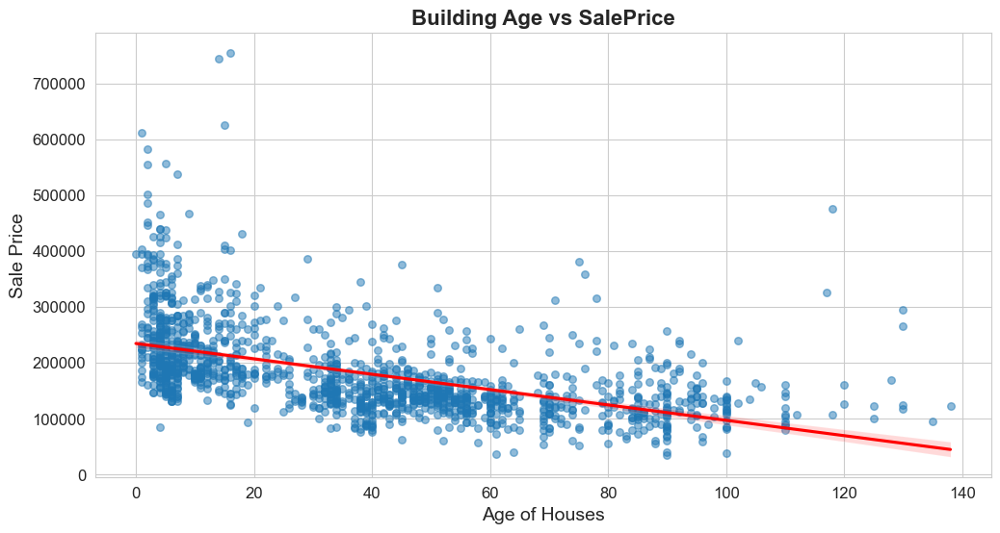

In [50]:
# Testing if building age affects SalePrice
df_analysis['BuildingAge']=df_analysis['YrSold'].max()-df_analysis['YearBuilt']
sns.set_style("whitegrid")

plt.figure(figsize=(12, 6))
sns.regplot(x=df_analysis['BuildingAge'], y=df_analysis['SalePrice'], scatter_kws={'s':30, 'alpha':0.5}, line_kws={'color':'red'})

plt.title('Building Age vs SalePrice', fontsize=16, fontweight='bold')
plt.xlabel('Age of Houses', fontsize=14)
plt.ylabel('Sale Price', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True)

plt.show()

The regression line shows a negative slope, as the age of a house increases, its sale price decreases. This is expected since older houses might require more maintenance.

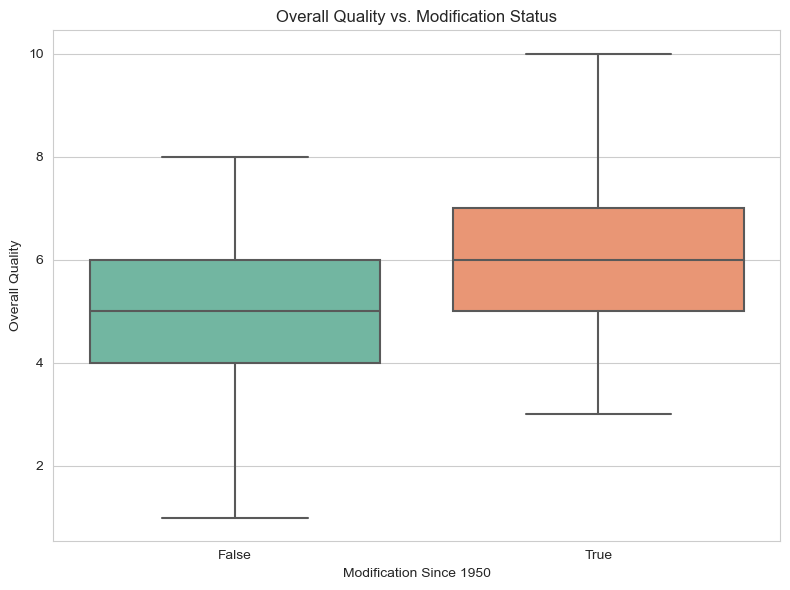

In [51]:
# Testing if overall quality is affected by modified vs non-modified houses
plt.figure(figsize=(8, 6))

# Overall Quality vs. Modification Status
sns.boxplot(data=df_analysis, x='ModifiedSince1950', y='OverallQual', palette='Set2')
plt.title('Overall Quality vs. Modification Status')
plt.xlabel('Modification Since 1950')
plt.ylabel('Overall Quality')

plt.tight_layout()
plt.show()

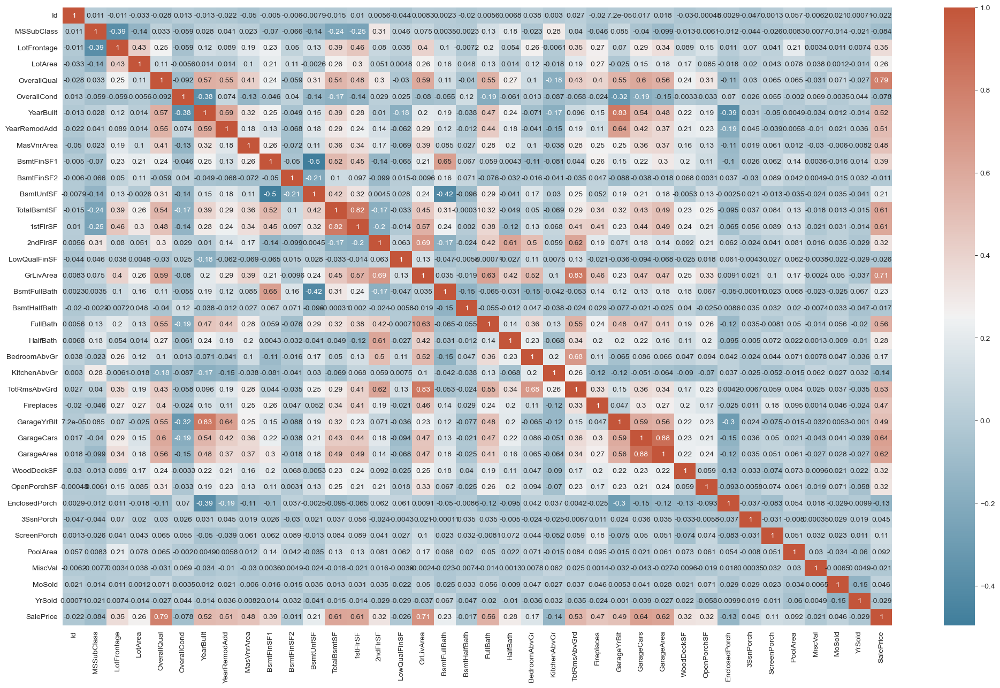

In [52]:
# Multivarient Analysis
plt.figure(figsize=(25, 15))

corr = df.select_dtypes(exclude=['object']).corr()
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, cbar_kws={"shrink": 1}, annot=True)
plt.show()

#**Data Transformation And Scaling**

In [53]:
df_sic=df_cleaned.copy()

In [54]:
df_sic=pd.get_dummies(df_sic, columns=['FireplaceQu','MasVnrType'],dtype=int)
df_sic.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,0,0,0,0,0,0,1,0,0
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,0,0,0,0,1,0,0,1,0
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,0,0,0,0,1,0,1,0,0
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000,0,0,1,0,0,0,0,1,0
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000,0,0,0,0,1,0,1,0,0


In [55]:
imputer = KNNImputer(n_neighbors=5)
columns_to_impute = ['FireplaceQu_Ex', 'FireplaceQu_Fa','FireplaceQu_Gd','FireplaceQu_Po','FireplaceQu_TA','LotFrontage','MasVnrType_BrkCmn','MasVnrType_BrkFace','MasVnrType_Stone']
df_sic[columns_to_impute] = imputer.fit_transform(df_sic[columns_to_impute])
print(df_sic[columns_to_impute].isnull().sum())

FireplaceQu_Ex        0
FireplaceQu_Fa        0
FireplaceQu_Gd        0
FireplaceQu_Po        0
FireplaceQu_TA        0
LotFrontage           0
MasVnrType_BrkCmn     0
MasVnrType_BrkFace    0
MasVnrType_Stone      0
dtype: int64


In [56]:
null_values = df_sic.isnull().sum()
print("Missing values per column:\n", null_values[null_values > 0])

Missing values per column:
 Series([], dtype: int64)


In [57]:
df_sic.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.237123,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.589041,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890,0.016438,0.022603,0.260274,0.013699,0.214384,0.010274,0.304795,0.591781,0.087671
std,421.610009,42.300571,22.648869,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,23.997022,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883,0.127198,0.148684,0.438934,0.116277,0.410535,0.100873,0.460478,0.491673,0.282913
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,365.750000,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,730.500000,50.000000,68.400000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.0

**Hot Encoding**

In [58]:
categorical_columns = df_sic.select_dtypes(include=['object']).columns
df_encoded = pd.get_dummies(df_sic, columns=categorical_columns, drop_first=True)
df_encoded.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0

In [59]:
boolean_columns = df_encoded.select_dtypes(include=['bool']).columns
if len(boolean_columns) > 0:
    df_encoded[boolean_columns] = df_encoded[boolean_columns].astype(int)

In [60]:
pd.set_option('display.max_columns', None)
df_encoded.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0

**Data Scaling**

**Dealing with outliers**

In [61]:
dfff=dffff.copy()

In [62]:
def detect_outliers_iqr(df):
    outlier_indices = []

    for column in df.select_dtypes(include=['float64', 'int64']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outlier_indices.extend(outliers.index)

        print(f'Outliers in {column}:', outliers.shape[0])

    return outlier_indices

In [63]:
def outliers(df):
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

    for column in numeric_columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outlier_count = df[(df[column] < lower_bound) | (df[column] > upper_bound)].shape[0]
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        print(f"Cap and floor outliers in '{column}'")

In [64]:
outlier_indices = detect_outliers_iqr(dfff)
print("Total outliers detected:", len(set(outlier_indices)))

Outliers in Id: 0
Outliers in MSSubClass: 103
Outliers in MSZoning: 309
Outliers in LotFrontage: 83
Outliers in LotArea: 69
Outliers in Street: 6
Outliers in LotShape: 0
Outliers in LandContour: 149
Outliers in Utilities: 1
Outliers in LotConfig: 0
Outliers in LandSlope: 78
Outliers in Neighborhood: 0
Outliers in Condition1: 200
Outliers in Condition2: 15
Outliers in BldgType: 240
Outliers in HouseStyle: 0
Outliers in OverallQual: 2
Outliers in OverallCond: 125
Outliers in YearBuilt: 7
Outliers in YearRemodAdd: 0
Outliers in RoofStyle: 319
Outliers in RoofMatl: 26
Outliers in Exterior1st: 21
Outliers in Exterior2nd: 20
Outliers in MasVnrType: 8
Outliers in MasVnrArea: 98
Outliers in ExterQual: 52
Outliers in ExterCond: 178
Outliers in Foundation: 9
Outliers in BsmtQual: 121
Outliers in BsmtCond: 112
Outliers in BsmtExposure: 221
Outliers in BsmtFinType1: 0
Outliers in BsmtFinSF1: 7
Outliers in BsmtFinType2: 166
Outliers in BsmtFinSF2: 167
Outliers in BsmtUnfSF: 29
Outliers in TotalBsmt

In [65]:
outliers(dfff)

Cap and floor outliers in 'Id'
Cap and floor outliers in 'MSSubClass'
Cap and floor outliers in 'MSZoning'
Cap and floor outliers in 'LotFrontage'
Cap and floor outliers in 'LotArea'
Cap and floor outliers in 'Street'
Cap and floor outliers in 'LotShape'
Cap and floor outliers in 'LandContour'
Cap and floor outliers in 'Utilities'
Cap and floor outliers in 'LotConfig'
Cap and floor outliers in 'LandSlope'
Cap and floor outliers in 'Neighborhood'
Cap and floor outliers in 'Condition1'
Cap and floor outliers in 'Condition2'
Cap and floor outliers in 'BldgType'
Cap and floor outliers in 'HouseStyle'
Cap and floor outliers in 'OverallQual'
Cap and floor outliers in 'OverallCond'
Cap and floor outliers in 'YearBuilt'
Cap and floor outliers in 'YearRemodAdd'
Cap and floor outliers in 'RoofStyle'
Cap and floor outliers in 'RoofMatl'
Cap and floor outliers in 'Exterior1st'
Cap and floor outliers in 'Exterior2nd'
Cap and floor outliers in 'MasVnrType'
Cap and floor outliers in 'MasVnrArea'
Cap 

In [66]:
outlier_indices = detect_outliers_iqr(dfff)
print("Total outliers detected:", len(set(outlier_indices)))

Outliers in Id: 0
Outliers in MSSubClass: 0
Outliers in MSZoning: 0
Outliers in LotFrontage: 0
Outliers in LotArea: 0
Outliers in Street: 0
Outliers in LotShape: 0
Outliers in LandContour: 0
Outliers in Utilities: 0
Outliers in LotConfig: 0
Outliers in LandSlope: 0
Outliers in Neighborhood: 0
Outliers in Condition1: 0
Outliers in Condition2: 0
Outliers in BldgType: 0
Outliers in HouseStyle: 0
Outliers in OverallQual: 0
Outliers in OverallCond: 0
Outliers in YearBuilt: 0
Outliers in YearRemodAdd: 0
Outliers in RoofStyle: 0
Outliers in RoofMatl: 0
Outliers in Exterior1st: 0
Outliers in Exterior2nd: 0
Outliers in MasVnrType: 0
Outliers in MasVnrArea: 0
Outliers in ExterQual: 0
Outliers in ExterCond: 0
Outliers in Foundation: 0
Outliers in BsmtQual: 0
Outliers in BsmtCond: 0
Outliers in BsmtExposure: 0
Outliers in BsmtFinType1: 0
Outliers in BsmtFinSF1: 0
Outliers in BsmtFinType2: 0
Outliers in BsmtFinSF2: 0
Outliers in BsmtUnfSF: 0
Outliers in TotalBsmtSF: 0
Outliers in Heating: 0
Outlier

In [67]:
from sklearn.preprocessing import RobustScaler
numerical_columns = dfff.select_dtypes(include=['float64', 'int64']).columns

numerical_columns = [col for col in numerical_columns if col in dfff.columns]
scaler = RobustScaler()
dfff[numerical_columns] = scaler.fit_transform(dfff[numerical_columns])
dfff.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,-1.000000,0.2,0.0,-0.227273,-0.254076,0.0,0.0,0.0,0.0,0.0,0.0,-0.7,0.0,0.0,0.0,1.0,0.5,0.0,0.652174,0.243243,0.0,0.0,0.00,0.0,-1.0,1.193303,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.452790,0.0,0.0,-0.559829,-0.269652,0.0,0.0,0.0,0.0,-0.453608,1.173077,0.0,0.380070,1.0,0.0,0.0,1.0,0.0,0.0,-1.0,1.0,0.0,-1.0,0.333333,0.0,0.589744,0.0,0.0,0.281573,0.0,0.0,0.0,0.000000,0.529412,0.0,0.0,0.0,0.0,0.0,-1.333333,0.0,0.0,0.0,0.541506
1,-0.998629,-0.6,0.0,0.454545,0.030015,0.0,0.0,0.0,0.0,-1.0,0.0,1.2,0.0,0.0,0.0,0.0,0.0,2.5,0.065217,-0.486486,0.0,0.0,-1.00,-1.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,-2.0,-0.5,0.834679,0.0,0.0,-0.330769,0.538308,0.0,0.0,0.0,0.0,0.343643,0.000000,0.0,-0.312090,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,-0.102564,0.0,0.0,-0.082816,0.0,0.0,0.0,1.773810,-0.367647,0.0,0.0,0.0,0.0,0.0,-0.333333,-0.5,0.0,0.0,0.220173
2,-0.997258,0.2,0.0,-0.090909,0.437624,0.0,-1.0,0.0,0.0,0.0,0.0,-0.7,0.0,0.0,0.0,1.0,0.5,0.0,0.608696,0.216216,0.0,0.0,0.00,0.0,-1.0,0.986301,-1.0,0.0,1.0,0.0,0.0,-1.0,0.0,0.143910,0.0,0.0,-0.074359,-0.142289,0.0,0.0,0.0,0.0,-0.327933,1.189560,0.0,0.497489,1.0,0.0,0.0,1.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.000000,0.0,0.538462,0.0,0.0,0.530021,0.0,0.0,0.0,0.000000,0.250000,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.720024
3,-0.995888,0.4,0.0,-0.454545,0.017663,0.0,-1.0,0.0,0.0,-2.0,0.0,-0.6,0.0,0.0,0.0,1.0,0.5,0.0,-1.260870,-0.648649,0.0,0.0,0.25,0.4,0.0,0.000000,0.0,0.0,-1.0,1.0,0.0,0.0,-0.5,-0.235170,0.0,0.0,0.106838,-0.468657,0.0,0.5,0.0,0.0,-0.247423,1.038462,0.0,0.390885,1.0,0.0,-1.0,0.0,0.0,0.0,-1.0,0.5,0.0,0.0,-0.666667,1.0,0.461538,1.0,1.0,0.670807,0.0,0.0,0.0,0.000000,0.147059,0.0,0.0,0.0,0.0,0.0,-1.333333,-1.0,0.0,0.0,-0.273728
4,-0.994517,0.2,0.0,0.636364,1.181201,0.0,-1.0,0.0,0.0,-1.0,0.0,0.3,0.0,0.0,0.0,1.0,1.0,0.0,0.586957,0.162162,0.0,0.0,0.00,0.0,-1.0,2.130898,-1.0,0.0,1.0,0.0,0.0,-2.5,0.0,0.381186,0.0,0.0,0.021368,0.305473,0.0,0.0,0.0,0.0,0.113893,1.446429,0.0,1.134029,1.0,0.0,0.0,1.0,1.0,0.0,-1.0,1.5,0.0,0.0,0.000000,0.0,0.512821,0.0,1.0,1.474120,0.0,0.0,0.0,1.142857,0.867647,0.0,0.0,0.0,0.0,0.0,2.000000,0.0,0.0,0.0,1.035406


In [68]:
dfff.shape

(1460, 77)

# Data Reduction

In [69]:
df = dfff.copy()

In [70]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodD

<Figure size 800x400 with 0 Axes>

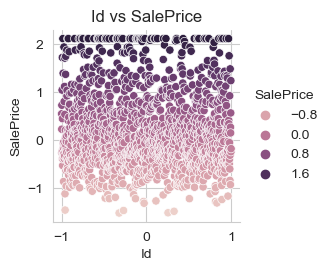

<Figure size 800x400 with 0 Axes>

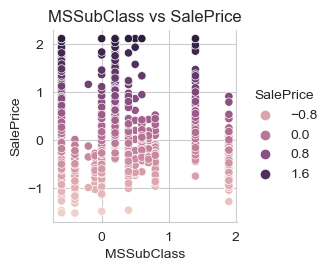

<Figure size 800x400 with 0 Axes>

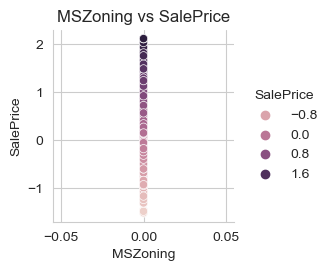

<Figure size 800x400 with 0 Axes>

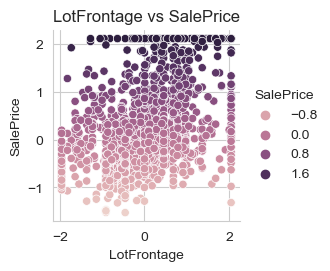

<Figure size 800x400 with 0 Axes>

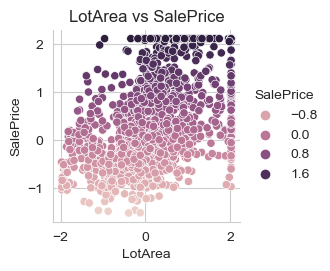

<Figure size 800x400 with 0 Axes>

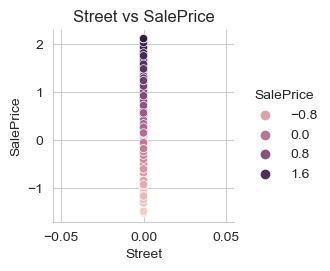

<Figure size 800x400 with 0 Axes>

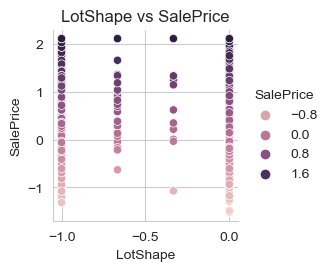

<Figure size 800x400 with 0 Axes>

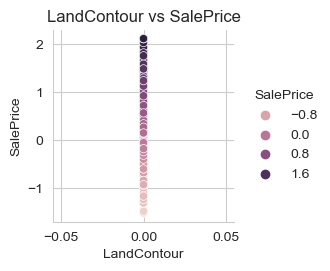

<Figure size 800x400 with 0 Axes>

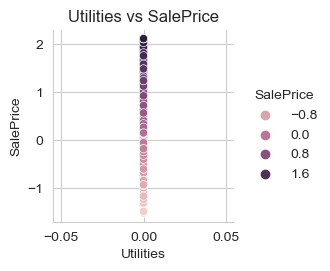

<Figure size 800x400 with 0 Axes>

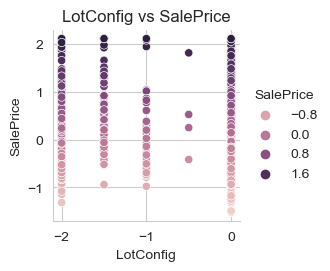

<Figure size 800x400 with 0 Axes>

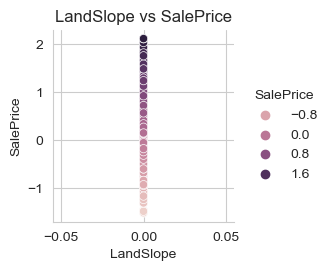

<Figure size 800x400 with 0 Axes>

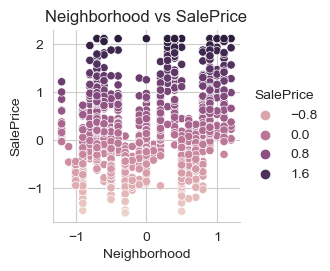

<Figure size 800x400 with 0 Axes>

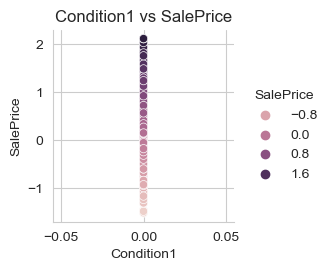

<Figure size 800x400 with 0 Axes>

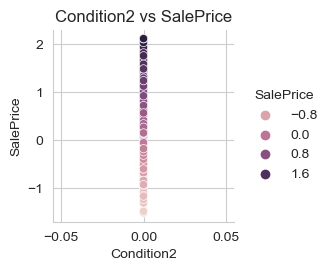

<Figure size 800x400 with 0 Axes>

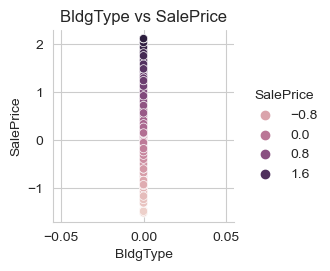

<Figure size 800x400 with 0 Axes>

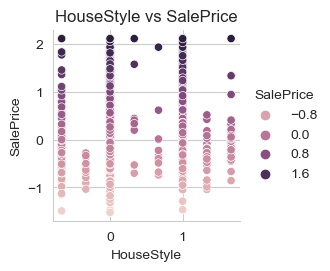

<Figure size 800x400 with 0 Axes>

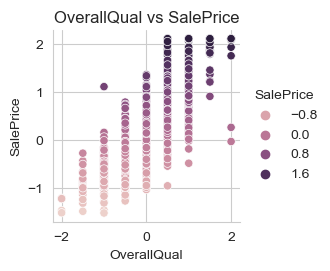

<Figure size 800x400 with 0 Axes>

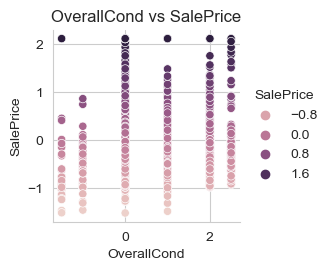

<Figure size 800x400 with 0 Axes>

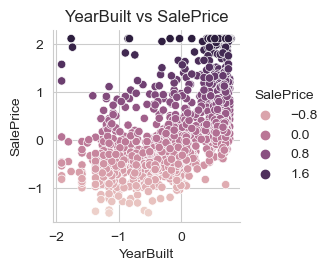

<Figure size 800x400 with 0 Axes>

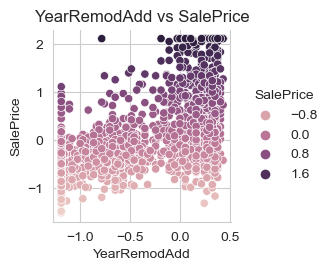

<Figure size 800x400 with 0 Axes>

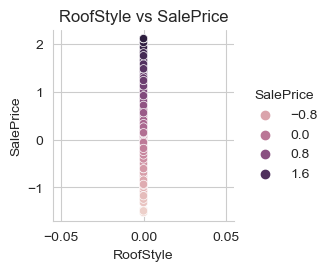

<Figure size 800x400 with 0 Axes>

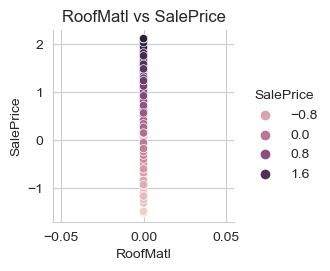

<Figure size 800x400 with 0 Axes>

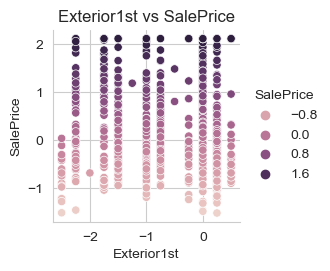

<Figure size 800x400 with 0 Axes>

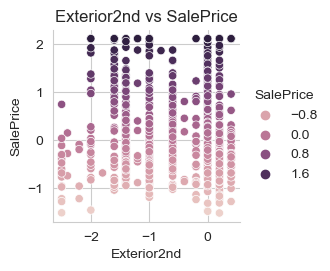

<Figure size 800x400 with 0 Axes>

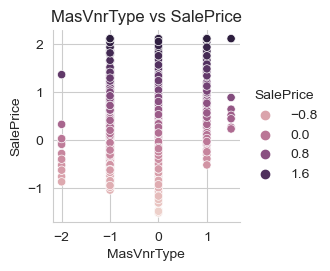

<Figure size 800x400 with 0 Axes>

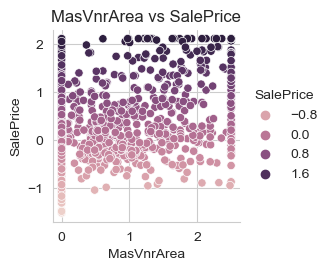

<Figure size 800x400 with 0 Axes>

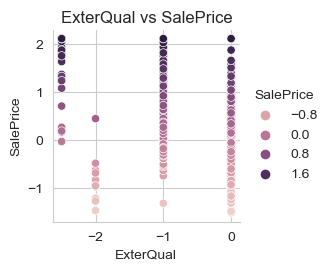

<Figure size 800x400 with 0 Axes>

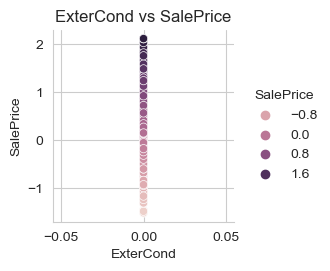

<Figure size 800x400 with 0 Axes>

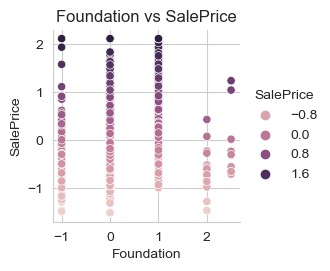

<Figure size 800x400 with 0 Axes>

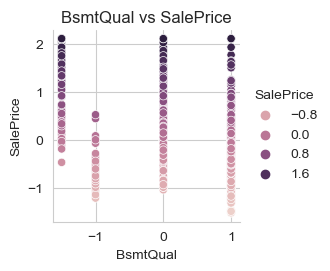

<Figure size 800x400 with 0 Axes>

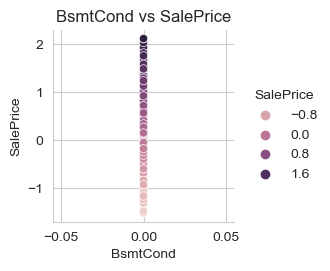

<Figure size 800x400 with 0 Axes>

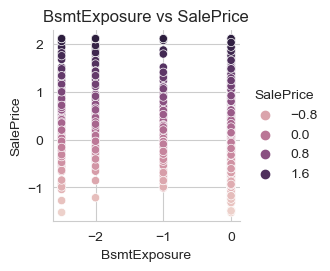

<Figure size 800x400 with 0 Axes>

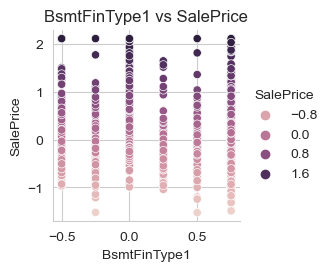

<Figure size 800x400 with 0 Axes>

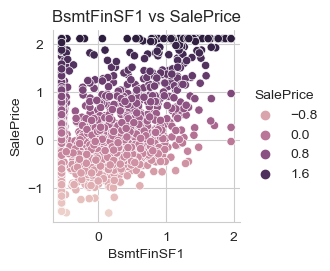

<Figure size 800x400 with 0 Axes>

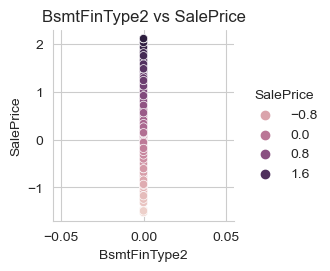

<Figure size 800x400 with 0 Axes>

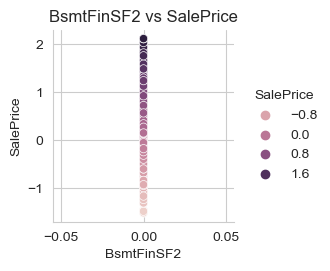

<Figure size 800x400 with 0 Axes>

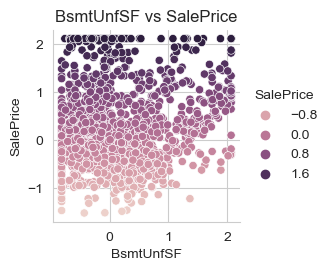

<Figure size 800x400 with 0 Axes>

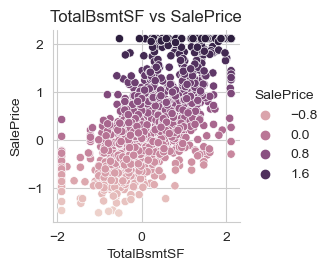

<Figure size 800x400 with 0 Axes>

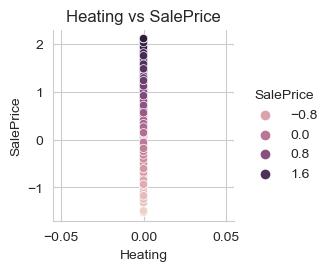

<Figure size 800x400 with 0 Axes>

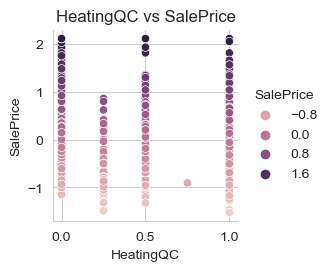

<Figure size 800x400 with 0 Axes>

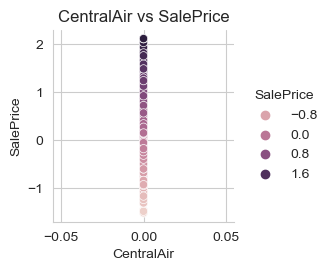

<Figure size 800x400 with 0 Axes>

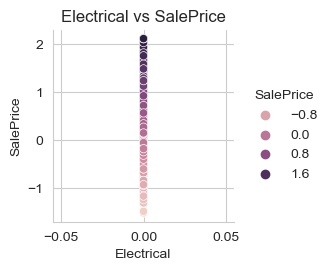

<Figure size 800x400 with 0 Axes>

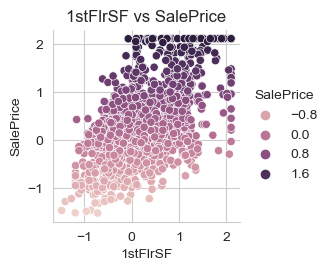

<Figure size 800x400 with 0 Axes>

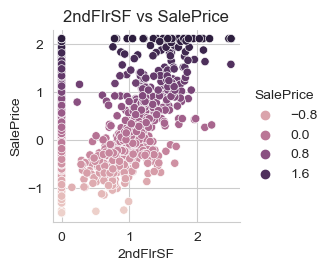

<Figure size 800x400 with 0 Axes>

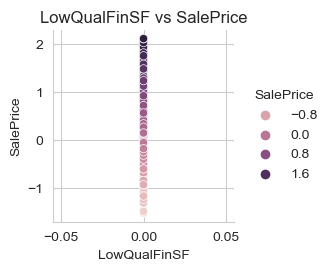

<Figure size 800x400 with 0 Axes>

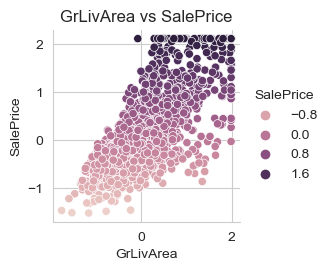

<Figure size 800x400 with 0 Axes>

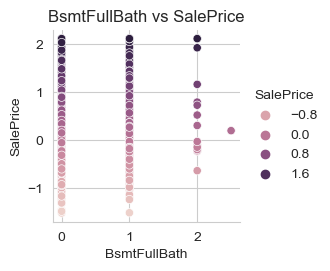

<Figure size 800x400 with 0 Axes>

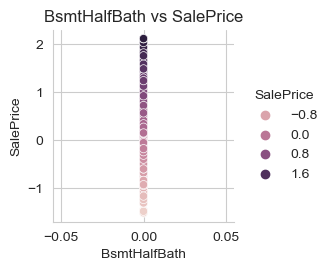

<Figure size 800x400 with 0 Axes>

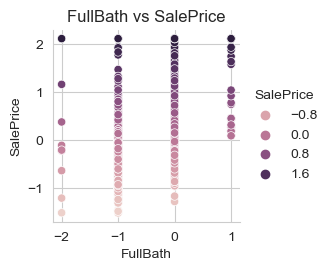

<Figure size 800x400 with 0 Axes>

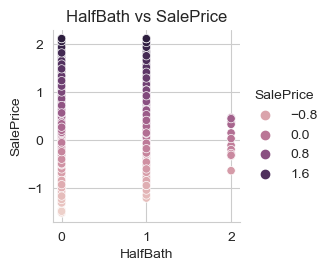

<Figure size 800x400 with 0 Axes>

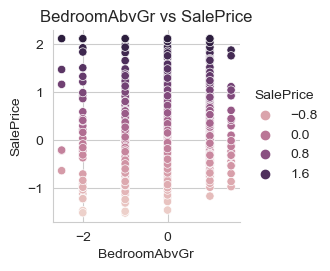

<Figure size 800x400 with 0 Axes>

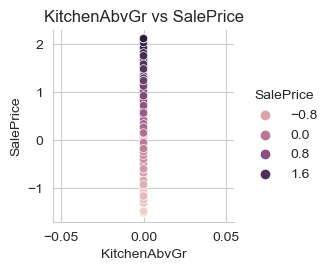

<Figure size 800x400 with 0 Axes>

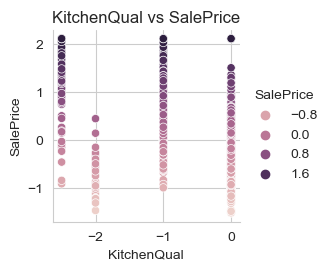

<Figure size 800x400 with 0 Axes>

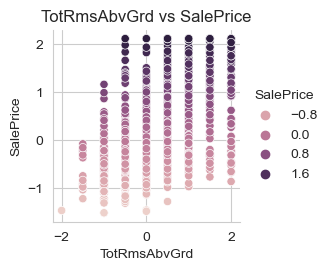

<Figure size 800x400 with 0 Axes>

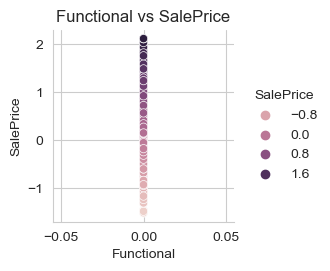

<Figure size 800x400 with 0 Axes>

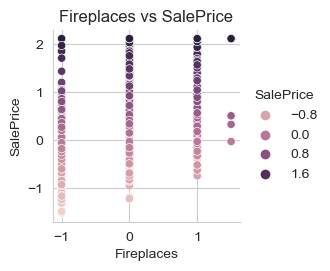

<Figure size 800x400 with 0 Axes>

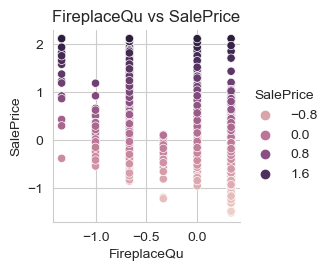

<Figure size 800x400 with 0 Axes>

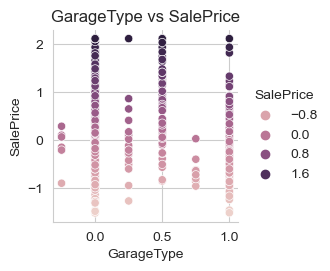

<Figure size 800x400 with 0 Axes>

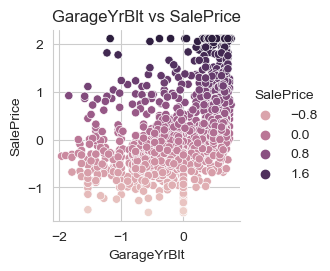

<Figure size 800x400 with 0 Axes>

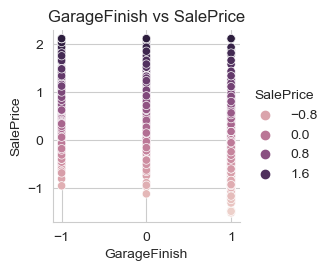

<Figure size 800x400 with 0 Axes>

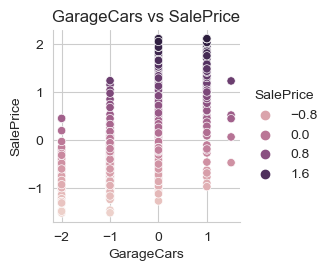

<Figure size 800x400 with 0 Axes>

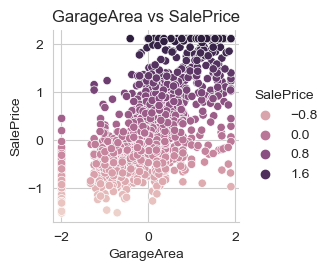

<Figure size 800x400 with 0 Axes>

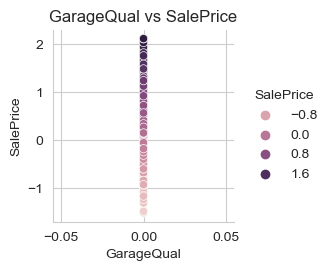

<Figure size 800x400 with 0 Axes>

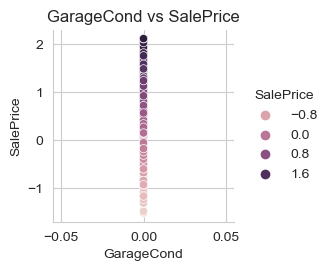

<Figure size 800x400 with 0 Axes>

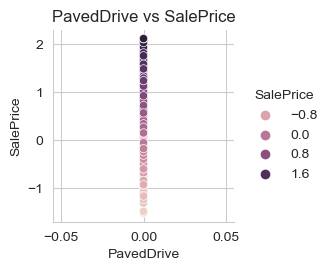

<Figure size 800x400 with 0 Axes>

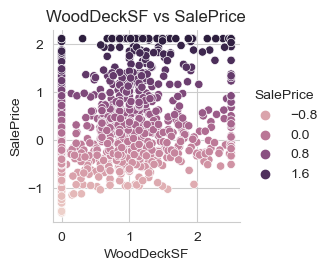

<Figure size 800x400 with 0 Axes>

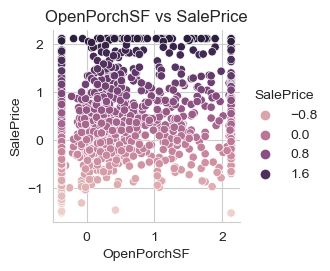

<Figure size 800x400 with 0 Axes>

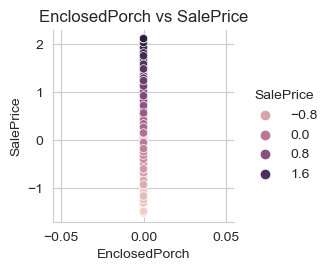

<Figure size 800x400 with 0 Axes>

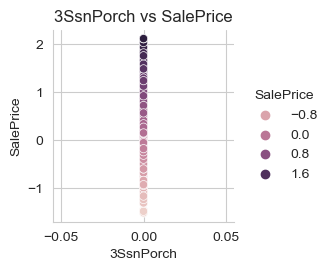

<Figure size 800x400 with 0 Axes>

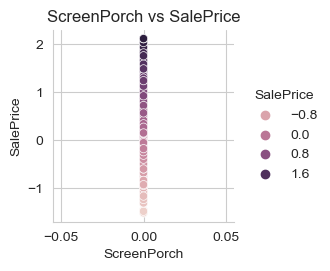

<Figure size 800x400 with 0 Axes>

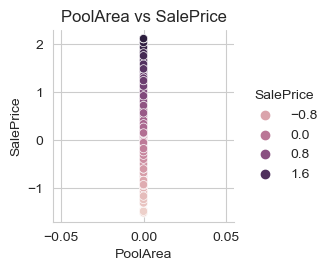

<Figure size 800x400 with 0 Axes>

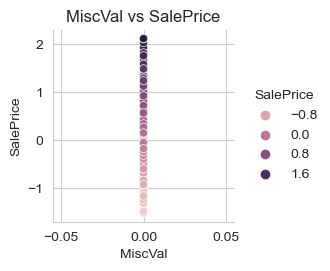

<Figure size 800x400 with 0 Axes>

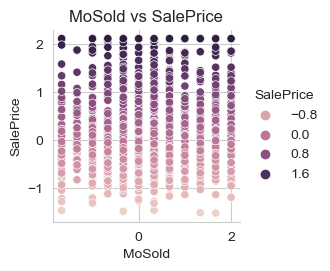

<Figure size 800x400 with 0 Axes>

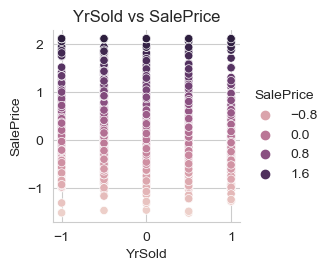

<Figure size 800x400 with 0 Axes>

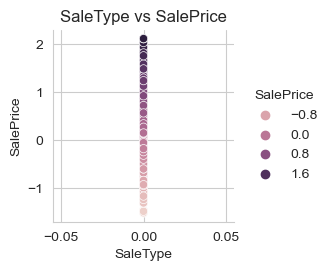

<Figure size 800x400 with 0 Axes>

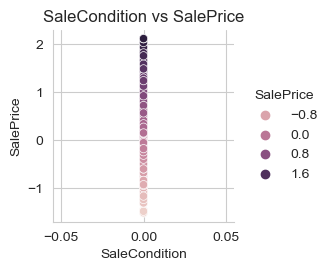

In [71]:
for col in df.columns:
    if col != "SalePrice":
        plt.figure(figsize=(8,4))
        sns.pairplot(y_vars=["SalePrice"], x_vars=[col], hue="SalePrice", data=df)
        plt.xlabel(col)
        plt.ylabel("SalePrice")
        plt.title(f"{col} vs SalePrice")
        plt.show()

In [72]:
unique_cols = df.loc[:, df.nunique() == 1].columns
unique_cols

Index(['MSZoning', 'Street', 'LandContour', 'Utilities', 'LandSlope',
       'Condition1', 'Condition2', 'BldgType', 'RoofStyle', 'RoofMatl',
       'ExterCond', 'BsmtCond', 'BsmtFinType2', 'BsmtFinSF2', 'Heating',
       'CentralAir', 'Electrical', 'LowQualFinSF', 'BsmtHalfBath',
       'KitchenAbvGr', 'Functional', 'GarageQual', 'GarageCond', 'PavedDrive',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [73]:
df.drop(unique_cols, axis=1, inplace=True)

In [74]:
df.drop(columns = ['Id', 'MoSold', 'YrSold'], axis=1, inplace=True)

In [75]:
df.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'LotShape', 'LotConfig',
       'Neighborhood', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC',
       '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'SalePrice'],
      dtype='object')

#**Feature Engineering**

In [76]:
df_new=df.copy()
df_new.head()

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice
0,0.2,-0.227273,-0.254076,0.0,0.0,-0.7,1.0,0.5,0.0,0.652174,0.243243,0.00,0.0,-1.0,1.193303,-1.0,1.0,0.0,0.0,0.0,0.452790,-0.559829,-0.269652,0.0,-0.453608,1.173077,0.380070,1.0,0.0,1.0,0.0,-1.0,1.0,-1.0,0.333333,0.0,0.589744,0.0,0.0,0.281573,0.000000,0.529412,0.541506
1,-0.6,0.454545,0.030015,0.0,-1.0,1.2,0.0,0.0,2.5,0.065217,-0.486486,-1.00,-1.0,0.0,0.000000,0.0,0.0,0.0,-2.0,-0.5,0.834679,-0.330769,0.538308,0.0,0.343643,0.000000,-0.312090,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,-0.102564,0.0,0.0,-0.082816,1.773810,-0.367647,0.220173
2,0.2,-0.090909,0.437624,-1.0,0.0,-0.7,1.0,0.5,0.0,0.608696,0.216216,0.00,0.0,-1.0,0.986301,-1.0,1.0,0.0,-1.0,0.0,0.143910,-0.074359,-0.142289,0.0,-0.327933,1.189560,0.497489,1.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.000000,0.0,0.538462,0.0,0.0,0.530021,0.000000,0.250000,0.720024
3,0.4,-0.454545,0.017663,-1.0,-2.0,-0.6,1.0,0.5,0.0,-1.260870,-0.648649,0.25,0.4,0.0,0.000000,0.0,-1.0,1.0,0.0,-0.5,-0.235170,0.106838,-0.468657,0.5,-0.247423,1.038462,0.390885,1.0,-1.0,0.0,0.0,-1.0,0.5,0.0,-0.666667,1.0,0.461538,1.0,1.0,0.670807,0.000000,0.147059,-0.273728
4,0.2,0.636364,1.181201,-1.0,-1.0,0.3,1.0,1.0,0.0,0.586957,0.162162,0.00,0.0,-1.0,2.130898,-1.0,1.0,0.0,-2.5,0.0,0.381186,0.021368,0.305473,0.0,0.113893,1.446429,1.134029,1.0,0.0,1.0,1.0,-1.0,1.5,0.0,0.000000,0.0,0.512821,0.0,1.0,1.474120,1.142857,0.867647,1.035406


In [77]:
from datetime import datetime
current_year = datetime.now().year
df_new['house_age'] = current_year - df_new['YearBuilt']
print(df_new[['YearBuilt', 'house_age']].head())


   YearBuilt    house_age
0   0.652174  2023.347826
1   0.065217  2023.934783
2   0.608696  2023.391304
3  -1.260870  2025.260870
4   0.586957  2023.413043


In [78]:
room_columns = df_new[['TotRmsAbvGrd', 'BedroomAbvGr']]
df_new['TotalRooms'] = df_new['TotRmsAbvGrd'] + df_new['BedroomAbvGr']
print(df_new[['TotRmsAbvGrd', 'BedroomAbvGr', 'TotalRooms']].tail())


      TotRmsAbvGrd  BedroomAbvGr  TotalRooms
1455           0.5           0.0         0.5
1456           0.5           0.0         0.5
1457           1.5           1.0         2.5
1458          -0.5          -1.0        -1.5
1459           0.0           0.0         0.0


In [79]:
area_columns = ['GrLivArea', 'TotalBsmtSF','1stFlrSF','2ndFlrSF']

df_new['TotalArea'] = df_new[area_columns].sum(axis=1)

print(df_new[['GrLivArea', 'TotalBsmtSF','1stFlrSF','2ndFlrSF', 'TotalArea']].head())

   GrLivArea  TotalBsmtSF  1stFlrSF  2ndFlrSF  TotalArea
0   0.380070    -0.269652 -0.453608  1.173077   0.829886
1  -0.312090     0.538308  0.343643  0.000000   0.569861
2   0.497489    -0.142289 -0.327933  1.189560   1.216828
3   0.390885    -0.468657 -0.247423  1.038462   0.713267
4   1.134029     0.305473  0.113893  1.446429   2.999823


In [80]:
df_new['AreaRatio'] = (df_new['TotalArea'] / df_new['LotArea'])*100

print(df_new[['TotalArea', 'LotArea', 'AreaRatio']].head())

   TotalArea   LotArea    AreaRatio
0   0.829886 -0.254076  -326.629109
1   0.569861  0.030015  1898.600155
2   1.216828  0.437624   278.053618
3   0.713267  0.017663  4038.186589
4   2.999823  1.181201   253.963873


In [81]:
df_new['QualityScore'] = ( df_new['OverallQual'] +  df_new['BsmtQual'] + df_new['HeatingQC'] + df_new['KitchenQual'])/4

print(df_new[['OverallQual' ,'BsmtQual' ,'HeatingQC','KitchenQual' ,'QualityScore']].head())


   OverallQual  BsmtQual  HeatingQC  KitchenQual  QualityScore
0          0.5       0.0        0.0         -1.0        -0.125
1          0.0       0.0        0.0          0.0         0.000
2          0.5       0.0        0.0         -1.0        -0.125
3          0.5       1.0        0.5         -1.0         0.250
4          1.0       0.0        0.0         -1.0         0.000


In [82]:
df_new.shape
df_new.head()

,MSSubClass,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,house_age,TotalRooms,TotalArea,AreaRatio,QualityScore
0,0.2,-0.227273,-0.254076,0.0,0.0,-0.7,1.0,0.5,0.0,0.652174,0.243243,0.00,0.0,-1.0,1.193303,-1.0,1.0,0.0,0.0,0.0,0.452790,-0.559829,-0.269652,0.0,-0.453608,1.173077,0.380070,1.0,0.0,1.0,0.0,-1.0,1.0,-1.0,0.333333,0.0,0.589744,0.0,0.0,0.281573,0.000000,0.529412,0.541506,2023.347826,1.0,0.829886,-326.629109,-0.125
1,-0.6,0.454545,0.030015,0.0,-1.0,1.2,0.0,0.0,2.5,0.065217,-0.486486,-1.00,-1.0,0.0,0.000000,0.0,0.0,0.0,-2.0,-0.5,0.834679,-0.330769,0.538308,0.0,0.343643,0.000000,-0.312090,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,-0.102564,0.0,0.0,-0.082816,1.773810,-0.367647,0.220173,2023.934783,0.0,0.569861,1898.600155,0.000
2,0.2,-0.090909,0.437624,-1.0,0.0,-0.7,1.0,0.5,0.0,0.608696,0.216216,0.00,0.0,-1.0,0.986301,-1.0,1.0,0.0,-1.0,0.0,0.143910,-0.074359,-0.142289,0.0,-0.327933,1.189560,0.497489,1.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.000000,0.0,0.538462,0.0,0.0,0.530021,0.000000,0.250000,0.720024,2023.391304,0.0,1.216828,278.053618,-0.125
3,0.4,-0.454545,0.017663,-1.0,-2.0,-0.6,1.0,0.5,0.0,-1.260870,-0.648649,0.25,0.4,0.0,0.000000,0.0,-1.0,1.0,0.0,-0.5,-0.235170,0.106838,-0.468657,0.5,-0.247423,1.038462,0.390885,1.0,-1.0,0.0,0.0,-1.0,0.5,0.0,-0.666667,1.0,0.461538,1.0,1.0,0.670807,0.000000,0.147059,-0.273728,2025.260870,0.5,0.713267,4038.186589,0.250
4,0.2,0.636364,1.181201,-1.0,-1.0,0.3,1.0,1.0,0.0,0.586957,0.162162,0.00,0.0,-1.0,2.130898,-1.0,1.0,0.0,-2.5,0.0,0.381186,0.021368,0.305473,0.0,0.113893,1.446429,1.134029,1.0,0.0,1.0,1.0,-1.0,1.5,0.0,0.000000,0.0,0.512821,0.0,1.0,1.474120,1.142857,0.867647,1.035406,2023.413043,2.5,2.999823,253.963873,0.000


# Data Modeling

**Linear Regression**

In [83]:
X = df_new.drop('SalePrice', axis=1)
y = df_new['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [84]:
# Scale the data to make it all in similer range to handle any kind of baisnes that the model can do.

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [85]:
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

LinearRegression()

In [86]:
# predicting on train data
y_train_pred = lr_model.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_train_pred) # Mean Squared Error for Train data
train_rmse = np.sqrt(train_mse) # Root Mean Squared Error for Train data
train_r2 = r2_score(y_train, y_train_pred) # R^2 Score on Train Data
print(f'Training MSE: {train_mse:.3f}')
print(f'Training RMSE: {train_rmse:.3f}')
print(f'Training R-squared: {round(train_r2,2)}%',"\n\n")


# predicting on test data
y_test_pred = lr_model.predict(X_test_scaled)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)
print(f'Test MSE: {test_mse:.3f}')
print(f'Test RMSE: {test_rmse:.3f}')
print(f'Test R-squared: {round(test_r2,2)}%')

Training MSE: 0.070
Training RMSE: 0.264
Training R-squared: 0.89% 


Test MSE: 0.068
Test RMSE: 0.262
Test R-squared: 0.9%


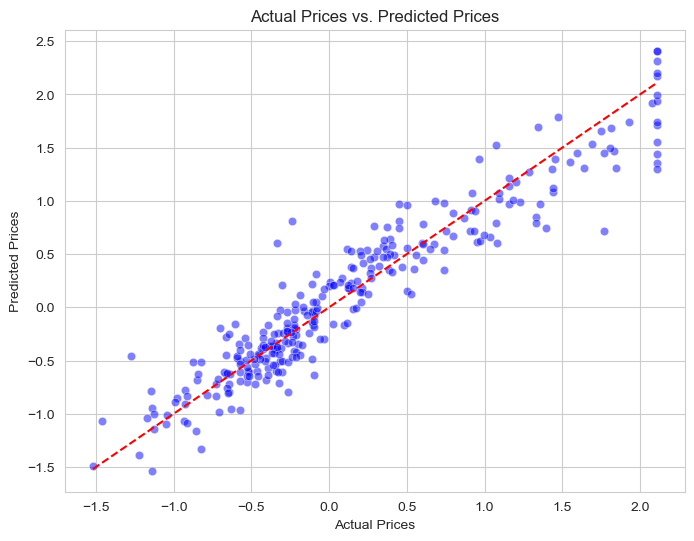

In [87]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_test_pred, color='b', alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='r')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual Prices vs. Predicted Prices')
plt.grid(True)
plt.show()

**Polynomial Regression**

In [88]:
columns = df.columns
columns = columns.drop('SalePrice')

In [89]:
corr_matrix = df.corr()
corr_with_target = corr_matrix['SalePrice'][columns]

# Select the features with the highest correlation coefficients
top_features = corr_with_target.abs().nlargest(n=2)

In [90]:
top_features.index

Index(['OverallQual', 'GrLivArea'], dtype='object')

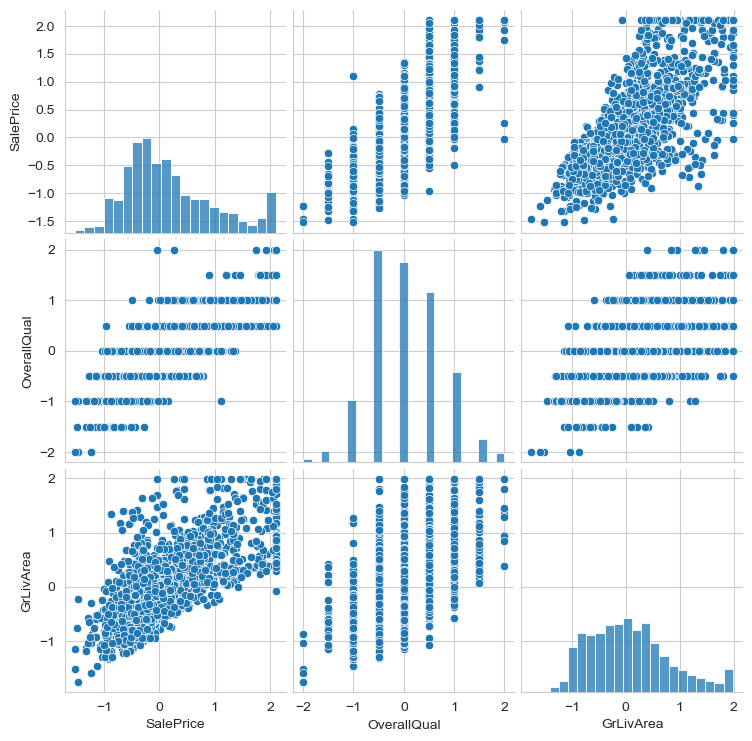

In [91]:
sns.pairplot(df[['SalePrice', 'OverallQual', 'GrLivArea']])

**Ridge**

In [92]:
ridge_model = Ridge(alpha=0.001)
ridge_model.fit(X_train_scaled, y_train) # Fit the model

Ridge(alpha=0.001)

In [93]:
# predicting on train data
y_train_pred = ridge_model.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_train_pred) # Mean Squared Error for Train data
train_rmse = np.sqrt(train_mse) # Root Mean Squared Error for Train data
train_r2 = r2_score(y_train, y_train_pred) # R^2 Score on Train Data
print(f'Training RMSE: {train_rmse:.3f}')
print(f'Training R-squared: {round(train_r2,2)}%',"\n\n")


# predicting on test data
y_test_pred = ridge_model.predict(X_test_scaled)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)
print(f'Test RMSE: {test_rmse:.3f}')
print(f'Test R-squared: {round(test_r2,2)}%')

Training RMSE: 0.264
Training R-squared: 0.89% 


Test RMSE: 0.262
Test R-squared: 0.9%


**Lasso**

In [94]:
lasso_model = Lasso(alpha=0.001)
lasso_model.fit(X_train_scaled, y_train) # Fit the model

Lasso(alpha=0.001)

In [95]:
# predicting on train data
y_train_pred = lasso_model.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_train_pred) # Mean Squared Error for Train data
train_rmse = np.sqrt(train_mse) # Root Mean Squared Error for Train data
train_r2 = r2_score(y_train, y_train_pred) # R^2 Score on Train Data
print(f'Training RMSE: {train_rmse:.3f}')
print(f'Training R-squared: {round(train_r2,2)}%',"\n\n")


# predicting on test data
y_test_pred = lasso_model.predict(X_test_scaled)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)
print(f'Test RMSE: {test_rmse:.3f}')
print(f'Test R-squared: {round(test_r2,2)}%')

Training RMSE: 0.265
Training R-squared: 0.89% 


Test RMSE: 0.260
Test R-squared: 0.9%


**Random Forest**

In [96]:
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train_scaled, y_train)

RandomForestRegressor(random_state=42)

In [97]:
# predicting on train data
y_train_pred = rf_model.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_train_pred) # Mean Squared Error for Train data
train_rmse = np.sqrt(train_mse) # Root Mean Squared Error for Train data
train_r2 = r2_score(y_train, y_train_pred) # R^2 Score on Train Data
print(f'Training RMSE: {train_rmse:.3f}')
print(f'Training R-squared: {round(train_r2,2)}%',"\n\n")


# predicting on test data
y_test_pred = rf_model.predict(X_test_scaled)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)
print(f'Test RMSE: {test_mse:.3f}')
print(f'Test R-squared: {round(test_r2,2)}%')

Training RMSE: 0.098
Training R-squared: 0.98% 


Test RMSE: 0.068
Test R-squared: 0.92%
